In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline


import dtale # load the dtale



In [3]:
data = pd.read_csv('data\data_preprocesamiento.csv')

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   BusinessTravel           4410 non-null   object 
 2   Department               4410 non-null   object 
 3   DistanceFromHome         4410 non-null   float64
 4   Education                4410 non-null   int64  
 5   EducationField           4410 non-null   object 
 6   EmployeeID               4410 non-null   int64  
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   float64
 12  NumCompaniesWorked       4410 non-null   int64  
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [5]:
#Es necesario volver a asignar las variables como variables object ya que al crearse el dataframe y volver
# a leerse con la libreria pandas, las variables vuelven a cambiar de tipo.
columns_category = ['BusinessTravel', 'Department','EducationField', 'EmployeeID','Attrition','Gender','JobRole',
                    'MaritalStatus']
data[columns_category] = data[columns_category].astype(object)
# data.drop(['EmployeeID'], axis = 1, inplace = True)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Age                      4410 non-null   int64  
 1   BusinessTravel           4410 non-null   object 
 2   Department               4410 non-null   object 
 3   DistanceFromHome         4410 non-null   float64
 4   Education                4410 non-null   int64  
 5   EducationField           4410 non-null   object 
 6   EmployeeID               4410 non-null   object 
 7   Gender                   4410 non-null   object 
 8   JobLevel                 4410 non-null   int64  
 9   JobRole                  4410 non-null   object 
 10  MaritalStatus            4410 non-null   object 
 11  MonthlyIncome            4410 non-null   float64
 12  NumCompaniesWorked       4410 non-null   int64  
 13  PercentSalaryHike        4410 non-null   int64  
 14  StockOptionLevel        

In [7]:
ProfileReport(data, title="Análisis Exploratorio de Datos")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [16]:
dtale.show(data) #Se crea un dtale, este permite hacer una mejor exploracion de los datos, aplicando filtros, graficos

2023-09-12 17:09:31,204 - INFO     - Executing shutdown due to inactivity...
2023-09-12 17:09:47,696 - INFO     - Executing shutdown...
2023-09-12 17:09:47,704 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer
2023-09-12 17:09:48,970 - ERROR    - weakly-referenced object no longer exists
2023-09-12 17:09:48,990 - ERROR    - weakly-referenced object no longer exists
2023-09-12 17:09:48,994 - ERROR    - weakly-referenced object no longer exists


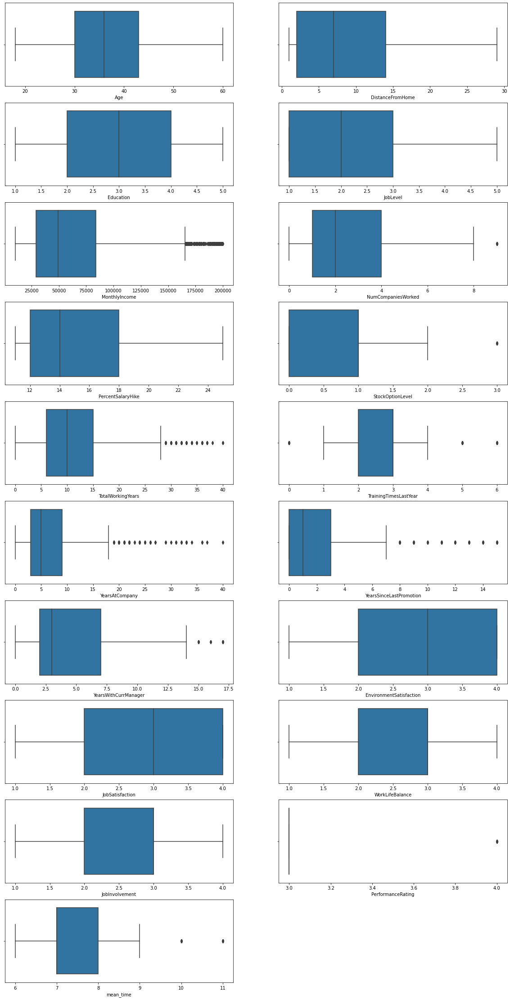

In [9]:
# --- Analisis de outliers ---
columns_boxplot = []
for i in data.columns:
    if data[i].dtype == 'int64' or data[i].dtype == 'float64':
        columns_boxplot.append(i)
# print(columns_boxplot)
plt.figure(figsize=(20,40))
for i, col in enumerate(columns_boxplot, start=1):
    ax = plt.subplot(10, 2, i)
    sns.boxplot(x = data[col], ax=ax)
    plt.xlabel(col)
plt.show()

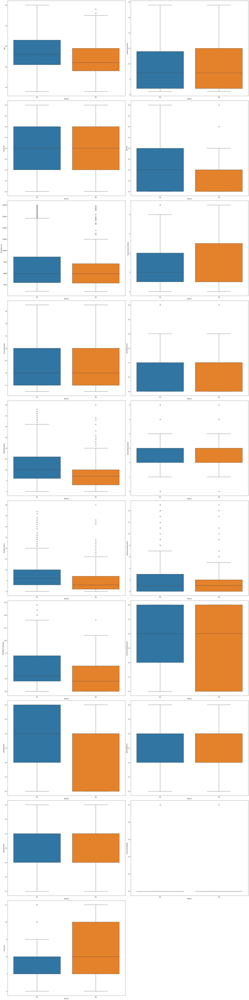

In [10]:
# Se crea un ciclo para poder observar como se comportan las variables numericas con la var objetivo Attrition
plt.figure(figsize=(30, 120))

for i, col in enumerate(columns_boxplot, start=1):
    ax = plt.subplot(10, 2, i)
    sns.boxplot(x='Attrition', y=col, data=data, ax=ax)
    plt.xlabel('Attrition')
    plt.ylabel(col)

plt.tight_layout()
plt.show()

Text(0.5, 1.0, 'Correlación entre variables')

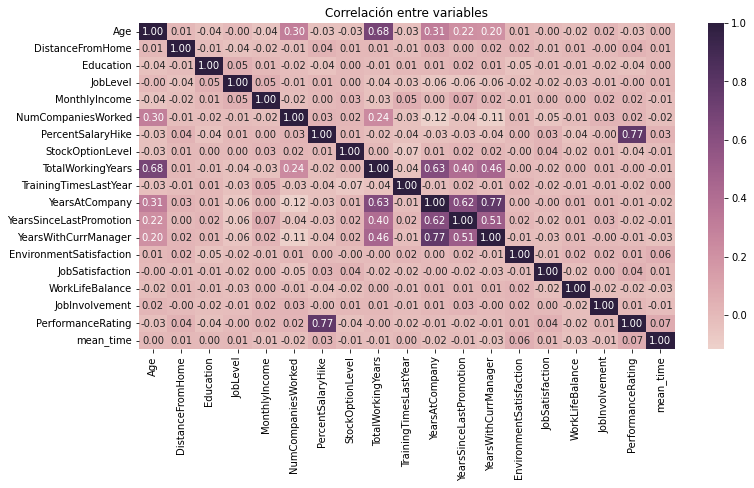

In [11]:

#Análisis de correlación con variables numericas
plt.figure(figsize = (12, 6))
sns.heatmap(data[columns_boxplot].corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap=True), fmt = ".2f")
plt.title("Correlación entre variables")

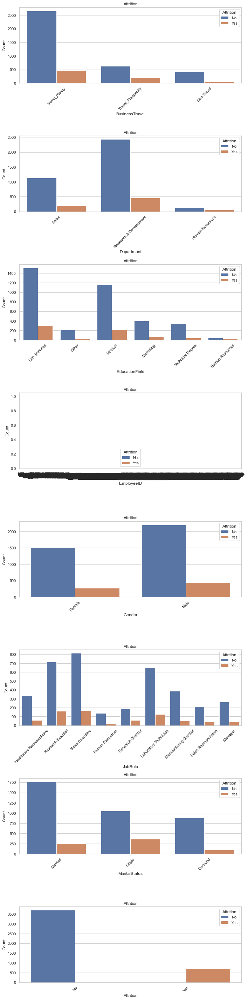

In [12]:
#Se compara la variable attrition con las variables categoricas
columns_countplot= []
for i in data.columns:
    if data[i].dtype != 'int64' and data[i].dtype != 'float64':
        columns_countplot.append(i)
# print(columns_countplot)

sns.set(style="whitegrid")  # Establecer estilo del gráfico

plt.figure(figsize=(10, 100))  # Tamaño de la figura

for i, col in enumerate(columns_countplot, start=1):

    ax = plt.subplot(20, 1, i)
    sns.countplot(x=col, hue='Attrition', data=data)
    # sns.countplot(x='DistanceFromHome', hue='Attrition', data=data)

    plt.xlabel(col)  # Etiqueta del eje x
    plt.ylabel('Count')  # Etiqueta del eje y
    plt.title('Attrition')  # Título del gráfico
    plt.legend(title='Attrition')  # Leyenda para 'Attrition'

    plt.xticks(rotation=45)  # Rotación de las etiquetas en el eje x para mayor legibilidad

plt.tight_layout()  # Ajustar el diseño del gráfico
plt.show()  # Mostrar el gráfico

In [13]:
#Se asignan las variables object a variables categoricas
dummies_variables = ["BusinessTravel", "Department", "Education", "EducationField", "Gender", "JobLevel", 
                     "Gender", "JobLevel", "JobRole", "MaritalStatus", "StockOptionLevel", "EnvironmentSatisfaction", 
                     "JobSatisfaction", "WorkLifeBalance", "JobInvolvement", "PerformanceRating"]
data_dummies = pd.get_dummies(data, columns=dummies_variables)

In [14]:
data_dummies = data.select_dtypes(include=['object'])
data_dummies.columns
data_dummies = pd.get_dummies(data, columns=data_dummies.columns)

In [15]:
data_dummies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4410 entries, 0 to 4409
Columns: 4457 entries, Age to Attrition_Yes
dtypes: float64(5), int64(14), uint8(4438)
memory usage: 19.3 MB


2023-09-12 12:46:48,879 - INFO     - Executing shutdown due to inactivity...
2023-09-12 12:47:05,494 - INFO     - Executing shutdown...
2023-09-12 12:47:05,509 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer
2023-09-12 12:47:07,190 - ERROR    - weakly-referenced object no longer exists
2023-09-12 12:47:07,207 - ERROR    - weakly-referenced object no longer exists
2023-09-12 12:47:07,207 - ERROR    - weakly-referenced object no longer exists
